# 1월 28일

In [62]:
import cv2, numpy as np
import math
import time
import random
from matplotlib import pyplot as plt
%matplotlib inline
from bokeh.plotting import figure
from bokeh.io import output_notebook, show, push_notebook

output_notebook()

Loading BokehJS ...

In [48]:
def imshow(tit, image) :
    plt.title(tit)    
    if len(image.shape) == 3 :
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    else :
        plt.imshow(image, cmap="gray")
    plt.show()
    
def create_win(frames, scale=1.0) :    
    global myImage
    
    all = []
    for f in frames :
        if len(f.shape ) !=  3 : f = cv2.cvtColor(f, cv2.COLOR_GRAY2BGR)
        all.append(f)
    frame = np.vstack(all)
    
    fr=cv2.cvtColor(frame, cv2.COLOR_BGR2RGBA) # because Bokeh expects a RGBA image
    fr=cv2.flip(fr, -1) # because Bokeh flips vertically
    width=fr.shape[1]
    height=fr.shape[0]    

    p = figure(x_range=(0,width), y_range=(0,height), output_backend="webgl", 
               width=int(width*scale), height=int(height*scale))    
    myImage = p.image_rgba(image=[fr], x=0, y=0, dw=width, dh=height)
    show(p, notebook_handle=True)   
    
def update_win(frames) :
    
    all = []
    for f in frames :
        if len(f.shape ) !=  3 : f = cv2.cvtColor(f, cv2.COLOR_GRAY2BGR)
        all.append(f)
    frame = np.vstack(all)
    
    fr=cv2.cvtColor(frame, cv2.COLOR_BGR2RGBA)
    fr=cv2.flip(fr, 0)
    myImage.data_source.data['image']=[fr]
    push_notebook()

In [49]:
classifier = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

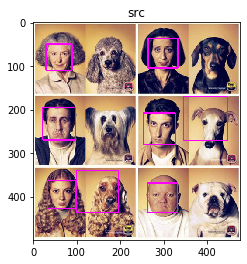

In [14]:
src = cv2.imread('dog.jpg')
faces = classifier.detectMultiScale(src)
for (x, y, w, h) in faces:
    cv2.rectangle(src, (x, y), (x + w, y + h), (255, 0, 255), 2)
imshow('src', src)    

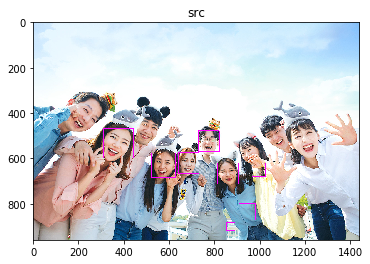

In [15]:
src = cv2.imread('group2.jpg')
faces = classifier.detectMultiScale(src)
for (x, y, w, h) in faces:
    cv2.rectangle(src, (x, y), (x + w, y + h), (255, 0, 255), 2)
imshow('src', src)    

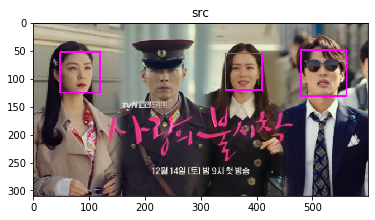

In [17]:
src = cv2.imread('a crash landing of love.jpg')
faces = classifier.detectMultiScale(src)
for (x, y, w, h) in faces:
    cv2.rectangle(src, (x, y), (x + w, y + h), (255, 0, 255), 2)
imshow('src', src)    

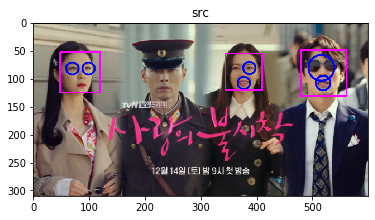

In [20]:
face_classifier=cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
eye_classifier=cv2.CascadeClassifier('haarcascade_eye.xml') #Cascade=다단계

src = cv2.imread('a crash landing of love.jpg')
faces = face_classifier.detectMultiScale(src)

for (x1, y1, w1, h1) in faces:
        cv2.rectangle(src, (x1, y1), (x1 + w1, y1 + h1), (255, 0, 255), 2) #사각형 틀
        faceROI = src[y1:y1 + h1, x1:x1 + w1]
        eyes = eye_classifier.detectMultiScale(faceROI) #얼굴 안에서 
        for (x2, y2, w2, h2) in eyes:
            center = (int(x2 + w2 / 2), int(y2 + h2 / 2)) #중심점 구한 후, 
            cv2.circle(faceROI, center, int(w2 / 2), (255, 0, 0), 2, cv2.LINE_AA) #눈 원그리기
imshow('src', src)   

*Histogram of Oriented Gradients(HOG)*
#Direction(방향), Magnitude(크기)
#각도를 구한 다음, 그 각도에 대한 크기를 고려해서 히스토그램 분포를 만듬
#사람검출하는데 사용

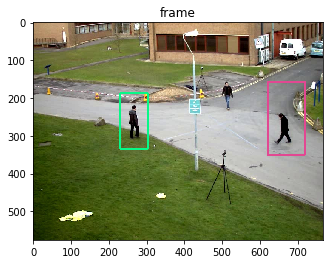

In [22]:
hog=cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

frame=cv2.imread("people.jpg")
detected, _ = hog.detectMultiScale(frame)

for (x, y, w, h) in detected:
        c = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
        cv2.rectangle(frame, (x, y), (x + w, y + h), c, 3)
#full-body 검출
imshow('frame', frame)   

<img src=HOG.png>

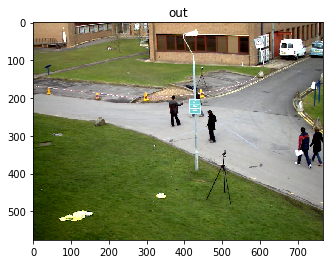

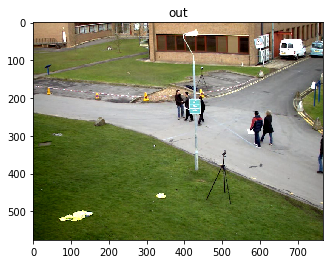

In [50]:
cap=cv2.VideoCapture('vtest.avi')

for i in range(20): #20초 시점의 frame
    ret,frame=cap.read() #frame 호출
imshow("out",frame)

for i in range(20):
    ret,frame=cap.read() 
imshow("out",frame)

In [51]:
create_win([frame], scale=0.7)

In [53]:
for i in range(300):
    ret,frame=cap.read() 
    if i==0:
        create_win([frame],scale=0.5)  
    if not ret:
        break
    detected, _ = hog.detectMultiScale(frame)    
    for (x, y, w, h) in detected:
        c = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
        cv2.rectangle(frame, (x, y), (x + w, y + h), c, 3)
    update_win([frame]) #영상을 보여주기 위해서 리스트 처리    

In [61]:
cap=cv2.VideoCapture('medicine.mp4')

for i in range(100):
    ret,frame=cap.read() 
    if i==0:
        create_win([frame],scale=0.5)  
    if not ret:
        break
    faces = classifier.detectMultiScale(frame)
    for (x, y, w, h) in faces:
        cv2.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 255), 2)
    update_win([frame]) #영상을 보여주기 위해서 리스트 처리    